# **Lab 5.2 Denoise & Deblur image with Autoencoder**

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader,Subset
from torch.utils.tensorboard import SummaryWriter
import copy

import numpy as np
import cv2
import os
import random
from skimage.util import random_noise
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from tqdm import tqdm

## Data Preparation
Complete the class `CustomImageDataset()` that `__getitem__` return ***noisy blury*** image and ***ground truth*** image.
Please ensure that the final image is in RGBscale and has a size of 128x128.
The gaussian blur kernel size parameter should be random in the range [3,11]
and gaussian noise mean should be randoom in range [-50,50].

Parameters:
- image_paths: A list of paths to the images to be loaded.
- gauss_noise: A boolean flag to indicate if Gaussian noise should be added to the image.
- gauss_blur: A boolean flag to indicate if Gaussian blur should be applied to the image.
- resize: The size to which the image should be resized.
- p: Probability of applying certain transformations (like Gaussian noise or blur).

<b>Noise Mean</b>: The noise mean represents the average value added to each pixel during the noise generation process.
- Negative values: Shift the pixel values towards darker intensities.
- Positive values: Shift the pixel values towards brighter intensities.

<b> kernel size</b>: determines the dimensions of the Gaussian blur filter applied to the image.
- Larger kernel sizes: Produce more pronounced blurring effects, smoothing out image details.
- Smaller kernel sizes: Result in less blurring, preserving more image details.

In [2]:
### START CODE HERE ###
class CustomImageDataset(torch.utils.data.Dataset):
    def __init__(self, image_paths, resize=128, crop_size=128, gauss_noise=False, gauss_blur=False, p=0.5):
        self.image_paths = image_paths
        self.resize = resize
        self.crop_size = crop_size
        self.gauss_noise = gauss_noise
        self.gauss_blur = gauss_blur
        self.p = p

    def __len__(self):
        return len(self.image_paths)

    def clip_to_uint8(self, image):
        """Clips image values to the range of 0-255 (uint8 format)"""
        return np.clip(image * 255.0, 0, 255).astype(np.uint8)  # Rescale and clip

    def __getitem__(self, idx):
        image = cv2.imread(self.image_paths[idx])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Resize and crop
        image = cv2.resize(image, (self.resize, self.resize))
        
        h, w, _ = image.shape
        start_x = (w - self.crop_size) // 2
        start_y = (h - self.crop_size) // 2
        image = image[start_y:start_y+self.crop_size, start_x:start_x+self.crop_size]

        # Ground truth
        gt_image = image.copy()

        # Augmentations
        if random.random() < self.p:
            if self.gauss_noise:
                # Add Gaussian noise
                noise_mean = random.uniform(-50, 50)
                var = 0.01
                noise = random_noise(image.astype(np.float32) / 255.0, mode='gaussian', var=var)  # var controls noise level
                image = image.astype(np.float32) / 255.0 + noise
                image = np.clip(image * 255.0, 0, 255).astype(np.uint8)  # Clip after adding noise
                #print(f"noise_mean: {noise_mean:.3f}", end=",\t")

            if self.gauss_blur:
                kernel_size = random.randint(3, 11)
                kernel_size = kernel_size if kernel_size % 2 == 1 else kernel_size + 1
                sigmaX = kernel_size / 3
                image = cv2.GaussianBlur(image, (kernel_size, kernel_size), sigmaX)
                #print("kernel_size", kernel_size)

        # Preprocess for PyTorch
        image = image.astype(np.float32) / 255.0
        gt_image = gt_image.astype(np.float32) / 255.0
        image = torch.from_numpy(image).permute(2, 0, 1)
        gt_image = torch.from_numpy(gt_image).permute(2, 0, 1)

        return image, gt_image
### END CODE HERE ###

Use your [`CustomImageDataset()`](https://pytorch.org/tutorials/beginner/data_loading_tutorial.html#:~:text=transformed_dataset%20%3D%20FaceLandmarksDataset,3%3A%0A%20%20%20%20%20%20%20%20break)  to load the dataset in the cell below. Then, display the image from the first batch.

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

- Noisy blury images (this reference use salt and pepper noise)<br>
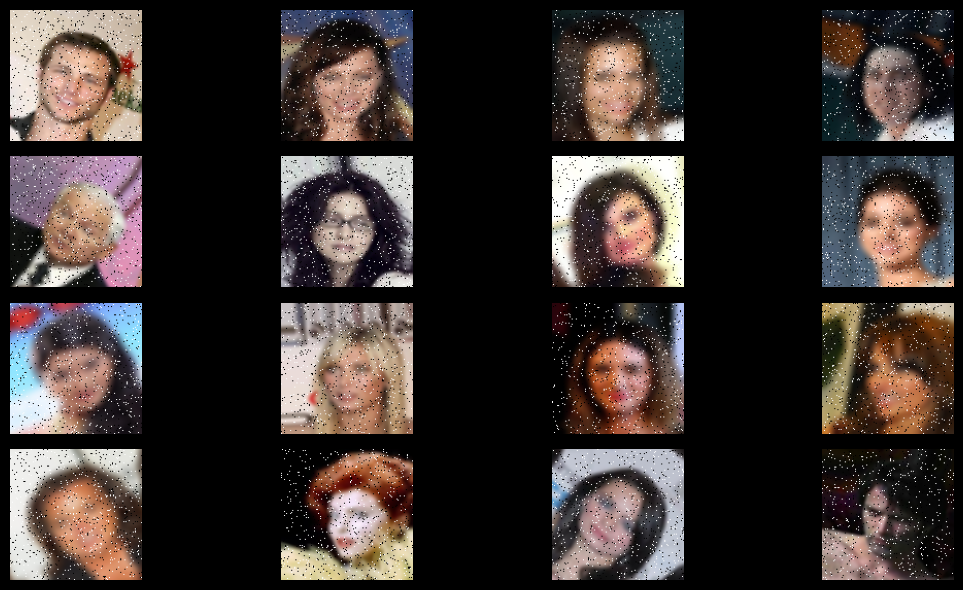

- Ground Truth images<br>
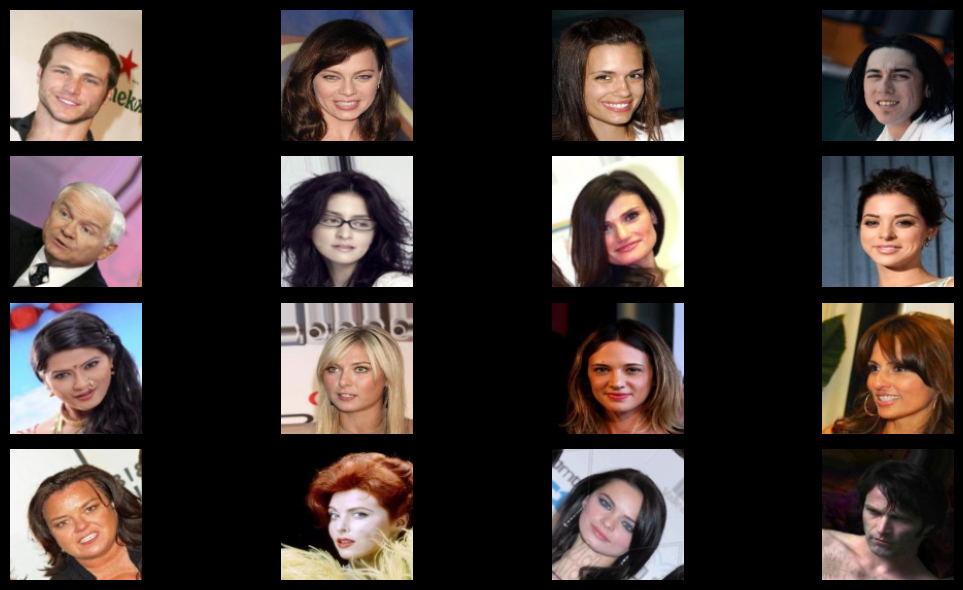

</details>

Complete the function below

In [3]:
### START CODE HERE ###
def convert_tensor_to_image(tensor, normalize=True):
    """
    Convert a tensor to a numpy image array.
    
    Parameters:
    - tensor (torch.Tensor): Input tensor of shape (C, H, W) or (N, C, H, W).
    - normalize (bool): Whether to normalize the image data to the range [0, 1].
    
    Returns:
    - np.ndarray: Image array with shape (H, W, C) for a single image or (N, H, W, C) for a batch.
    """
    if tensor.ndimension() == 4:
        # Batch of images
        tensor = tensor[0]  # Take the first image in the batch
        
    # Convert to numpy
    image = tensor.cpu().numpy().transpose(1, 2, 0)
    
    # Normalize to [0, 1] if needed
    if normalize:
        image = (image - np.min(image)) / (np.max(image) - np.min(image))
        image = np.clip(image * 255, 0, 255).astype(np.uint8)
    
    return image

def imshow_grid(images, normalize=True, cmap=None):
    """
    Display a grid of images.
    
    Parameters:
    - images (list of torch.Tensor or np.ndarray): List of images to display.
    - normalize (bool): Whether to normalize images before displaying.
    - cmap (str or None): Colormap for grayscale images (e.g., 'gray'). None for color images.
    """
    num_images = len(images)
    sqrt_n = int(np.ceil(np.sqrt(num_images)))
    fig, axes = plt.subplots(sqrt_n, sqrt_n, figsize=(sqrt_n*2, sqrt_n*2))
    axes = axes.flatten()
    
    for i in range(num_images):
        # Convert tensor to image
        if isinstance(images[i], torch.Tensor):
            image = convert_tensor_to_image(images[i], normalize)
        else:
            image = images[i]

        # Determine if the image is grayscale or color
        if cmap:  # Apply colormap if specified
            if image.ndim == 3 and image.shape[2] == 3:
                # Convert color image to grayscale using average method
                image_gray = np.mean(image, axis=2)
                axes[i].imshow(image_gray, cmap=cmap)
            else:
                axes[i].imshow(image, cmap=cmap)
        else:
            axes[i].imshow(image)
            
        axes[i].axis('off')
    
    # Hide any remaining axes
    for j in range(num_images, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.show()
### END CODE HERE ###

In [4]:
### START CODE HERE ###
data_dir = "images/img_align_celeba/"
image_paths = [os.path.join(data_dir, img) for img in os.listdir(data_dir)]
print("Size:",len(image_paths))

dataset = CustomImageDataset(image_paths, gauss_noise=True, gauss_blur=True)
batch_size = 16
dataloader = DataLoader(dataset, batch_size=batch_size)
### END CODE HERE ###

Size: 13882


Noisy blury images


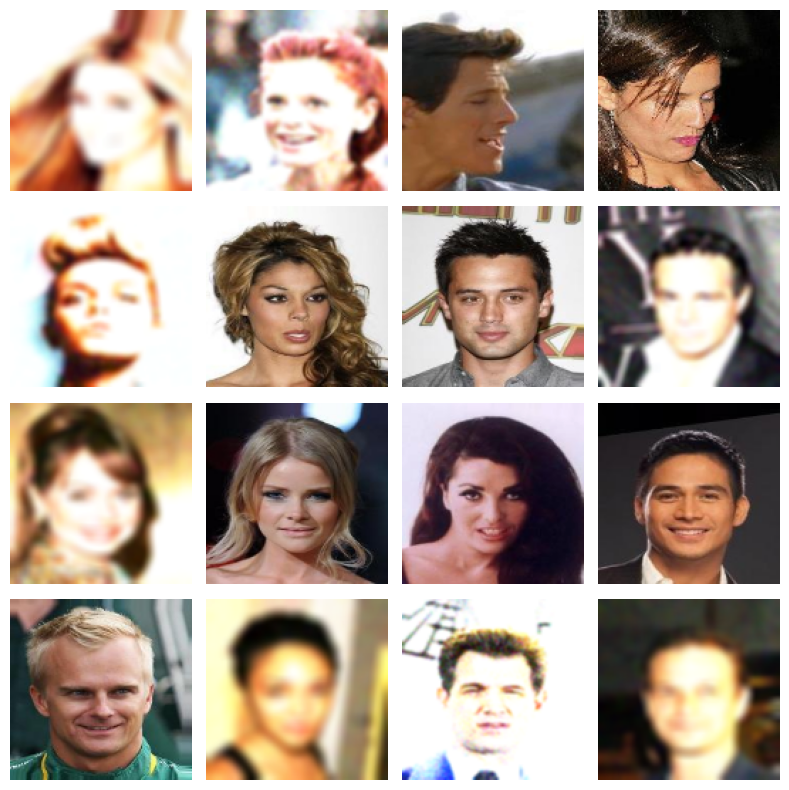

Ground Truth images


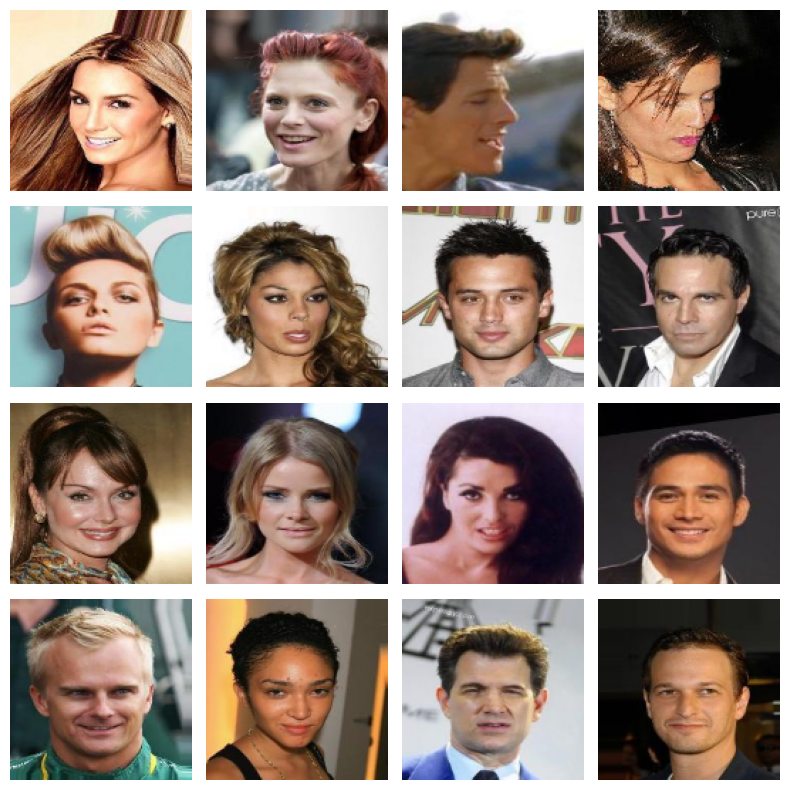

In [5]:
### START CODE HERE ###
batch, gt_img = next(iter(dataloader))

# Display the first image and its ground truth
print("Noisy blury images")
imshow_grid(batch[:batch_size])
print("Ground Truth images")
imshow_grid(gt_img[:batch_size])
### END CODE HERE ###

## Create Autoencoder model
You can design your own Autoencoder model based on the provided code below. However, please maintain the concept of 'Autoencoder'.
[Read more.](https://pytorch.org/tutorials/beginner/introyt/modelsyt_tutorial.html)

In [6]:
### START CODE HERE ###
class DownSamplingBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        super(DownSamplingBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=stride, padding=padding)
        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

    def forward(self, x):
        x = self.conv(x)
        x = self.relu(x)
        x = self.pool(x)
        return x

class UpSamplingBlock(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        super(UpSamplingBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=stride, padding=padding)
        self.relu = nn.ReLU()
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

    def forward(self, x):
        x = self.conv(x)
        x = self.relu(x)
        x = self.upsample(x)
        return x


class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()

        # Encoder
        self.conv_in = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1)
        self.down1 = DownSamplingBlock(64, 128)
        self.down2 = DownSamplingBlock(128, 256)
        
        # Latent Space
        self.latent = nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1)

        # Decoder
        self.up1 = UpSamplingBlock(512, 256)
        self.up2 = UpSamplingBlock(256, 128)
        self.up3 = UpSamplingBlock(128, 64)

        # Final Convolution to get the original image size
        self.conv_out = nn.Conv2d(64, 3, kernel_size=3, stride=1, padding=1)

    def forward(self, x):
        # Encoder
        x = self.conv_in(x)          # Shape: [batch_size, 64, 128, 128]

        x = self.down1(x)           # Shape: [batch_size, 128, 64, 64]
        x = self.down2(x)           # Shape: [batch_size, 256, 32, 32]

        # Latent Space
        x = self.latent(x)          # Shape: [batch_size, 512, 32, 32]

        # Decoder
        x = self.up1(x)             # Shape: [batch_size, 256, 64, 64]
        x = self.up2(x)             # Shape: [batch_size, 128, 128, 128]
        x = self.up3(x)             # Shape: [batch_size, 64, 256, 256]

        # Resize to match the input size (128x128)
        x = F.interpolate(x, size=(128, 128), mode='bilinear', align_corners=True)

        # Final Convolution to get the original image size
        x = self.conv_out(x)        # Shape: [batch_size, 3, 128, 128]

        return x
### END CODE HERE ###

If you define your model class correcly, the cell below should run without any errors.

In [7]:
model = Autoencoder()
print(model)

Autoencoder(
  (conv_in): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (down1): DownSamplingBlock(
    (conv): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU()
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (down2): DownSamplingBlock(
    (conv): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU()
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (latent): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (up1): UpSamplingBlock(
    (conv): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU()
    (upsample): Upsample(scale_factor=2.0, mode='bilinear')
  )
  (up2): UpSamplingBlock(
    (conv): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (relu): ReLU()
    (upsample): Upsample(scale_factor=2.0, mode='bilinear')
  )
  (up3): UpS

## Train Autoencoder
Complete the `train()` function in the cell below. This function should evaluate the model at every epoch, log the ***training loss, test loss,test PSNR, test SSIM***. Additionally, it should save the model at the last epoch.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The log should resemble this, but not be identical

```
🤖Training on cuda
🚀Training Epoch [1/1]: 100%|██████████| 1313/1313 [01:45<00:00, 12.41batch/s, loss=0.0102] 
📄Testing: 100%|██████████| 563/563 [01:10<00:00,  7.95batch/s, loss=0.0106, psnr=16.7, ssim=0.348] 
Summary :
	Train	avg_loss: 0.017262999383663165
	Test	avg_loss: 0.010476540363861867 
                PSNR : 16.839487147468034 
                SSIM : 0.36090552368883694
...
```

</details>

Resource : [PyTorch Training loop](<https://pytorch.org/tutorials/beginner/introyt/trainingyt.html#:~:text=%3D0.9)-,The%20Training%20Loop,-Below%2C%20we%20have>), [PSNR & SSIM](https://ieeexplore.ieee.org/document/5596999)

In [8]:
### START CODE HERE ###
def train(model, opt, loss_fn, train_loader, test_loader, epochs=10, checkpoint_path=None, device='cpu'):
    print(f"🤖 Training on {device}")
    model = model.to(device)
    
    for epoch in range(epochs):
        model.train()
        train_loss = 0.0
        train_bar = tqdm(train_loader, desc=f'🚀 Training Epoch [{epoch+1}/{epochs}]', unit='batch', leave=False)
        for images, gt in train_bar:
            images, gt = images.to(device), gt.to(device)
            
            opt.zero_grad()
            output = model(images)
            
            if output.shape != gt.shape:
                raise ValueError(f"Output shape {output.shape} does not match ground truth shape {gt.shape}")

            loss = loss_fn(output, gt)
            loss.backward()
            opt.step()
            
            train_loss += loss.item()
            avg_train_loss = train_loss / (train_bar.n + 1)
            train_bar.set_postfix(loss=f"{avg_train_loss:.4f}")

        avg_train_loss = train_loss / len(train_loader)
        print(f"\nEpoch [{epoch+1}/{epochs}] - Average Training Loss: {avg_train_loss:.4f}")
        
        model.eval()
        test_loss = 0.0
        psnr_values = []
        ssim_values = []
        test_bar = tqdm(test_loader, desc=f'📄 Testing Epoch [{epoch+1}/{epochs}]', unit='batch', leave=False)
        with torch.no_grad():
            for images, gt in test_bar:
                images, gt = images.to(device), gt.to(device)
                output = model(images)
                
                if output.shape != gt.shape:
                    raise ValueError(f"Output shape {output.shape} does not match ground truth shape {gt.shape}")
                
                loss = loss_fn(output, gt)
                test_loss += loss.item()
                
                for i in range(images.size(0)):
                    gt_image = gt[i].cpu().numpy().transpose(1, 2, 0)
                    output_image = output[i].cpu().numpy().transpose(1, 2, 0)

                    data_range=255.0 # Assuming images are normalized in the range [0, 255]
                    
                    psnr_value = psnr(gt_image, output_image, data_range=data_range)
                    ssim_value = ssim(gt_image, output_image, multichannel=True, win_size=3, data_range=data_range)
                    
                    psnr_values.append(psnr_value)
                    ssim_values.append(ssim_value)
                
                avg_test_loss = test_loss / (test_bar.n + 1)
                test_bar.set_postfix(loss=f"{avg_test_loss:.4f}", psnr=f"{np.mean(psnr_values):.1f}", ssim=f"{np.mean(ssim_values):.3f}")

        avg_test_loss = test_loss / len(test_loader)
        avg_psnr = np.mean(psnr_values)
        avg_ssim = np.mean(ssim_values)
        
        print(f"\nSummary :")
        print(f"\tTrain\tavg_loss: {avg_train_loss:.6f}")
        print(f"\tTest\tavg_loss: {avg_test_loss:.6f}")
        print(f"\t\tPSNR : {avg_psnr:.6f}")
        print(f"\t\tSSIM : {avg_ssim:.6f}")

        if checkpoint_path:
            torch.save(model.state_dict(), checkpoint_path)
            print(f"Model saved to {checkpoint_path}")
### END CODE HERE ###

Let's train your model.

In [9]:
## START CODE HERE ###
data_dir = "images/img_align_celeba/"

files = os.listdir(data_dir)
files = [os.path.join(data_dir, file) for file in files]

# Split the dataset into training and testing sets
train_files, test_files = train_test_split(files, test_size=0.3, shuffle=True, random_state=2024)

train_dataset = CustomImageDataset(train_files, gauss_noise=True, gauss_blur=True)
test_dataset = CustomImageDataset(test_files, gauss_noise=True, gauss_blur=True)
trainloader = DataLoader(train_dataset, batch_size=16, shuffle=True)
testloader = DataLoader(test_dataset, batch_size=16, shuffle=False)
## END CODE HERE ###

In [10]:
# data_dir = "images/img_align_celeba/"

# # List all image files in the directory
# files = os.listdir(data_dir)
# files = [os.path.join(data_dir, file) for file in files]

# # Define the size of the subsets
# train_size = 15  # Number of images for training
# test_size = 20     # Number of images for testing

# # Sample a small subset of files
# sampled_files = np.random.choice(files, size=train_size + test_size, replace=False)

# # Split the sampled files into training and testing sets
# train_files, test_files = train_test_split(sampled_files, test_size=test_size, random_state=42)

# # Create dataset objects with the option for augmentations like Gaussian noise and blur
# train_dataset = CustomImageDataset(train_files, gauss_noise=True, gauss_blur=True)
# test_dataset = CustomImageDataset(test_files, gauss_noise=True, gauss_blur=True)



# # Create DataLoaders for both training and testing datasets
# trainloader = DataLoader(train_dataset, batch_size=16, shuffle=True)
# testloader = DataLoader(test_dataset, batch_size=16, shuffle=False)


# # Print the sizes of the datasets
# print(f"Number of training files: {len(train_files)}")
# print(f"Number of test files: {len(test_files)}")

In [11]:
### START CODE HERE ###
model = Autoencoder()
opt = optim.Adam(model.parameters(), lr=0.001)
loss_fn = nn.MSELoss()

# Optionally specify a path to save the model
checkpoint_path = "autoencoder_checkpoint.pth"

# Train the model
train(model, opt, loss_fn, trainloader, testloader, epochs=1, checkpoint_path=checkpoint_path, device='cpu')
### END CODE HERE ###

🤖 Training on cpu



Epoch [1/1] - Average Training Loss: 0.1393



Summary :
	Train	avg_loss: 0.139293
	Test	avg_loss: 0.018168
		PSNR : 66.309524
		SSIM : 0.998040
Model saved to autoencoder_checkpoint.pth


Let's use your trained model.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

- Input images<br>
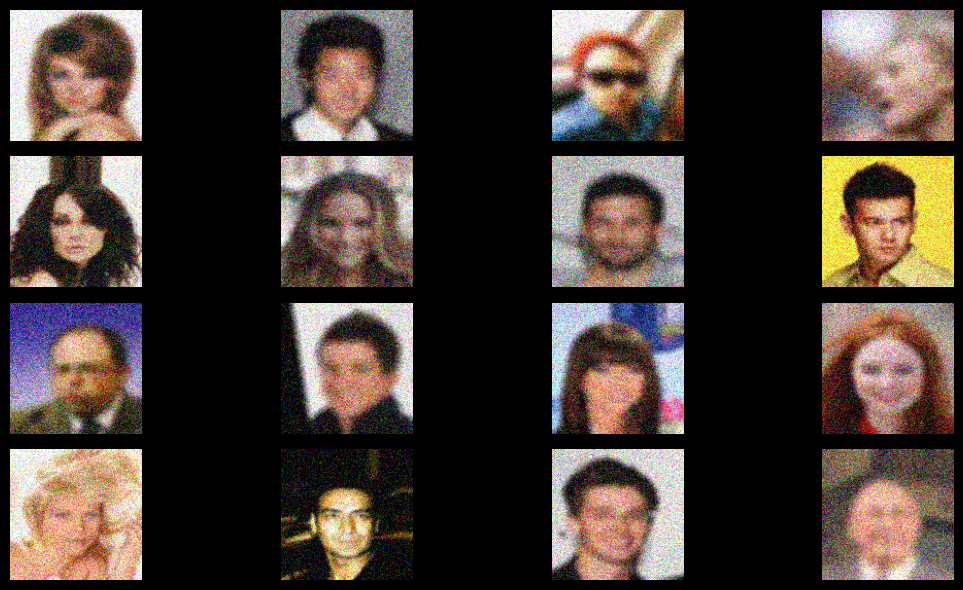

- Output images<br>
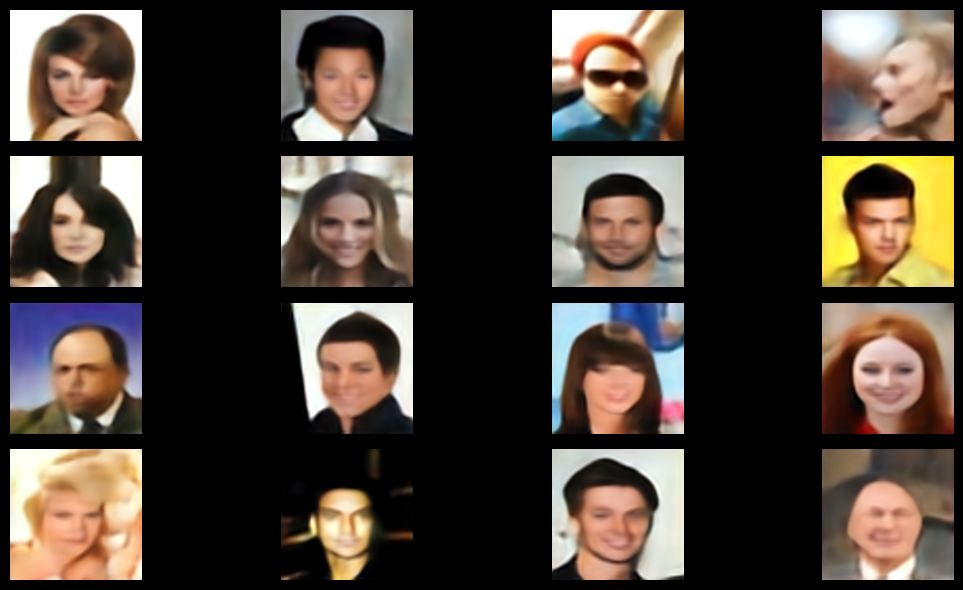

- Ground Truth images<br>
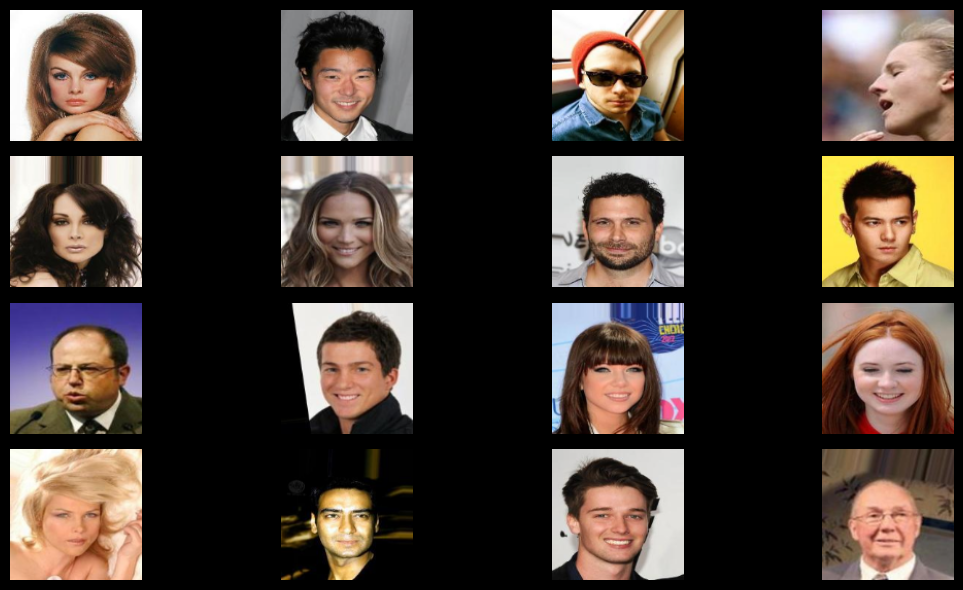

</details>

Displaying sample images:
Input images:


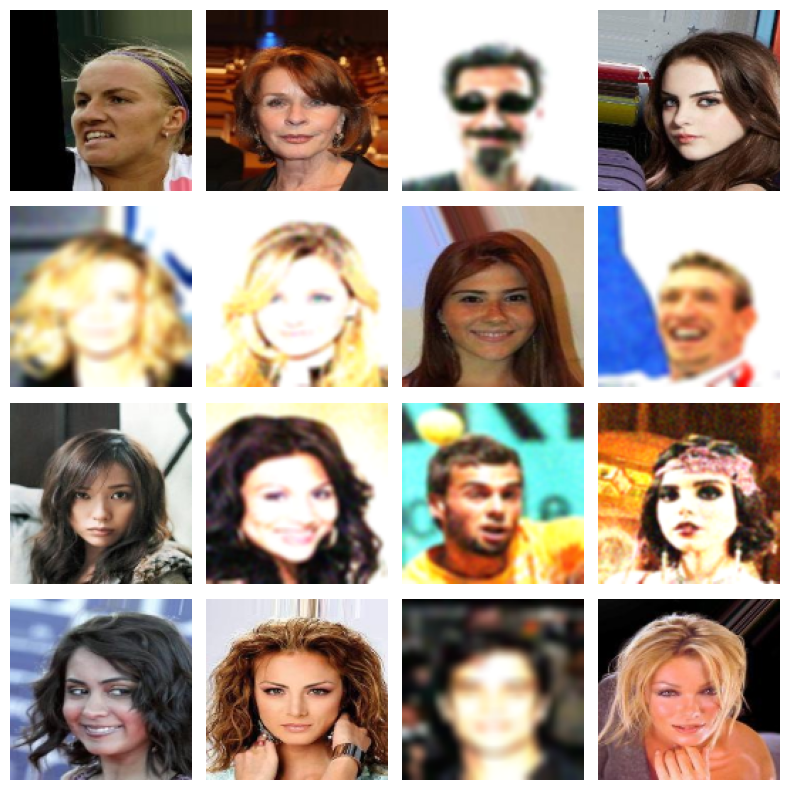

Output images:


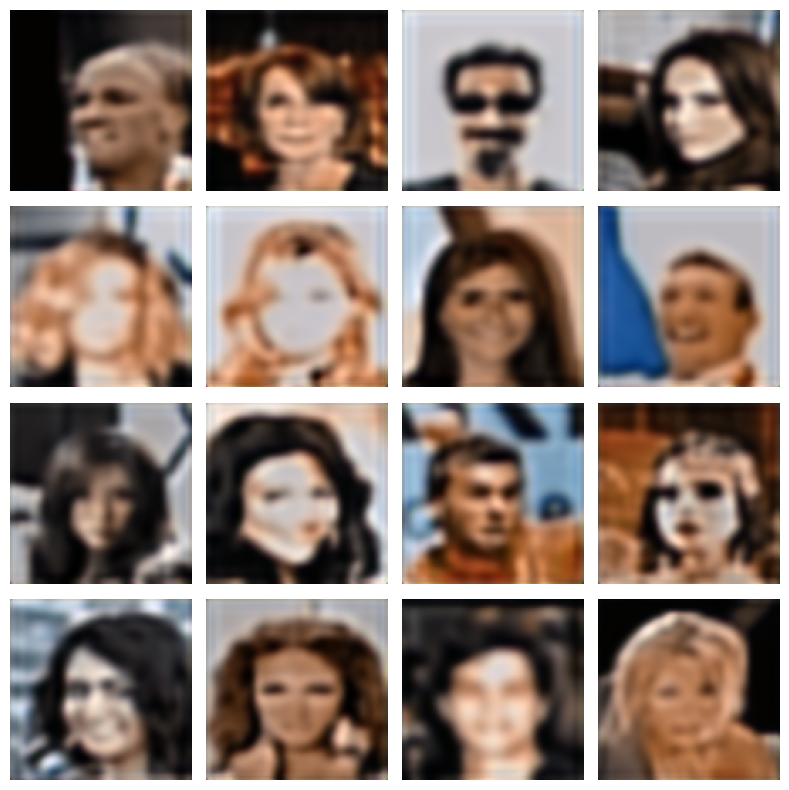

Ground Truth images:


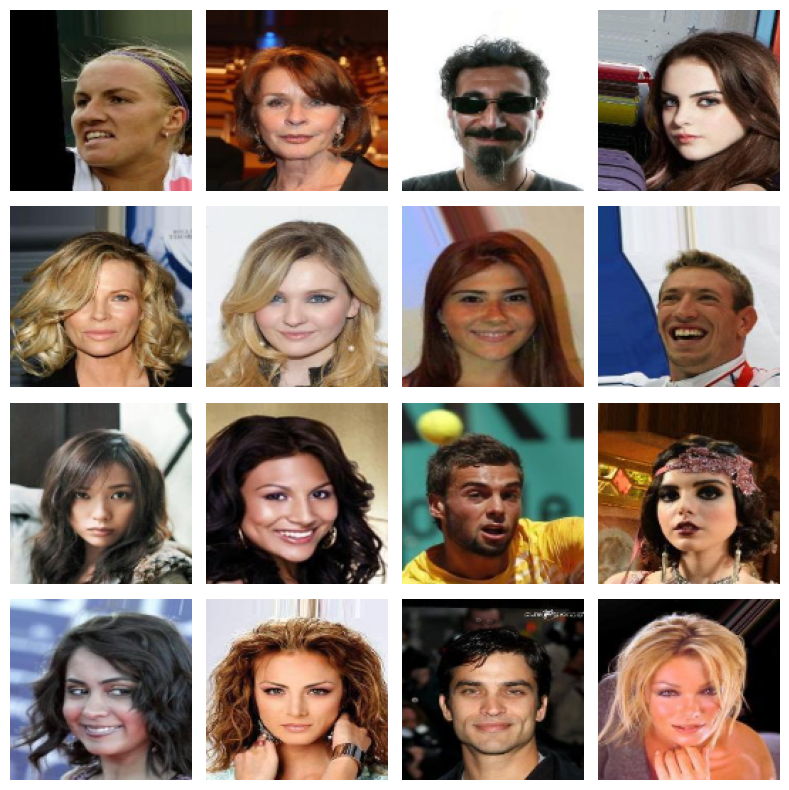

In [100]:
### START CODE HERE ###
# Define a function to display images
def display_sample_images(model, dataloader, device='cpu'):
    model.eval()
    with torch.no_grad():
        for images, gt in dataloader:
            images, gt = images.to(device), gt.to(device)
            outputs = model(images)
            # Convert images and outputs to CPU and numpy arrays
            images = images.cpu()
            gt = gt.cpu()
            outputs = outputs.cpu()

            # Prepare sample images for display
            num_samples = min(len(images), 16)  # Limit to 16 samples for display
            sample_images = [images[i] for i in range(num_samples)]
            sample_gts = [gt[i] for i in range(num_samples)]
            sample_outputs = [outputs[i] for i in range(num_samples)]

            print("Displaying sample images:")
            print("Input images:")
            imshow_grid(sample_images)  # Display input images
            print("Output images:")
            # print(sample_outputs[0].ndim )
            imshow_grid(sample_outputs)
            print("Ground Truth images:")
            imshow_grid(sample_gts)      # Display ground truth images
            
            break  # Only display the first batch

# Call the function with your model and data loader
display_sample_images(model, testloader, device='cpu')
### END CODE HERE ###

## Explore feature map
Use the `FeatureExtractor()` class and `visualize_feature_map()` function to visualize the feature map of ***ALL*** layers or block of your model. Then, save it as an image.
<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

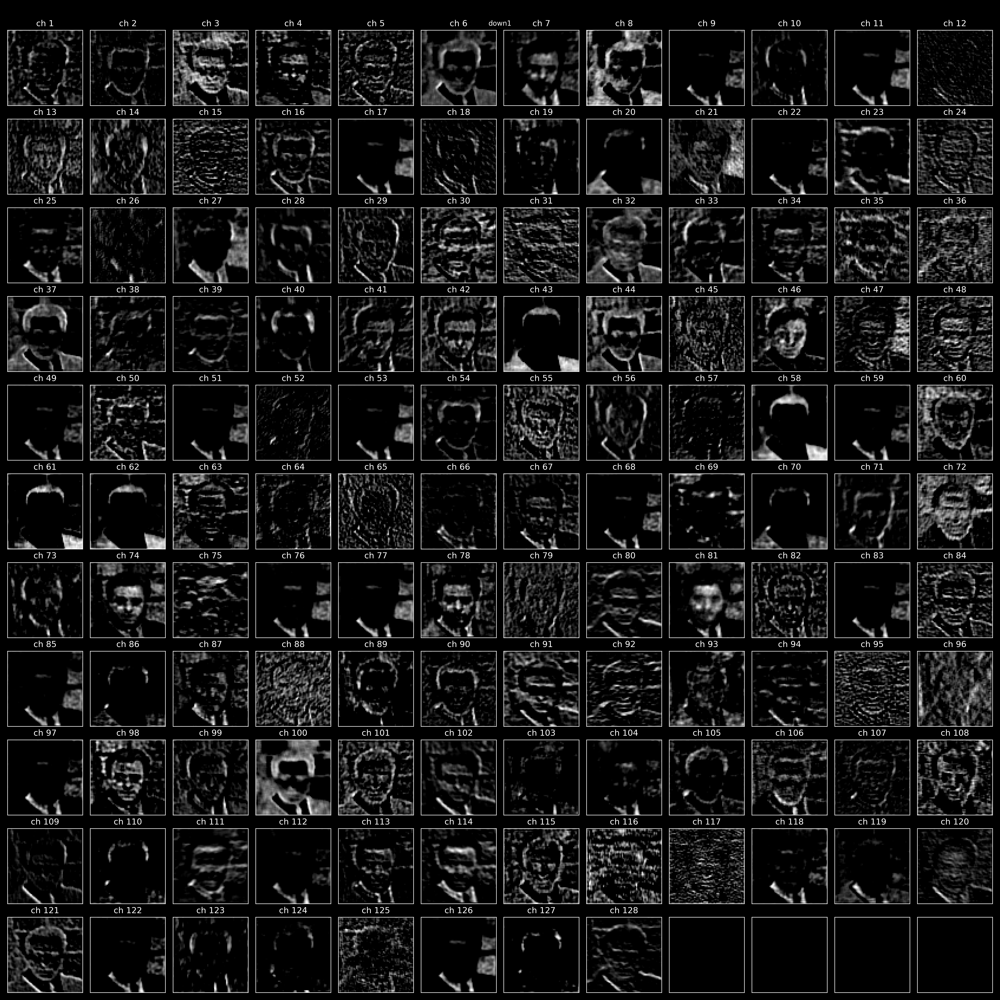
</details>

In [101]:
class FeatureExtractor(nn.Module):
    def __init__(self, model, target_layers):
        super(FeatureExtractor, self).__init__()
        self.model = copy.deepcopy(model)
        self.target_layers = target_layers
        self.features = []

        for layer_name, layer in self.model.named_modules():
            if layer_name in target_layers:
                layer.register_forward_hook(self.save_feature(layer_name))

    def save_feature(self, layer_name):
        def hook(module, input, output):
            self.features.append(output)
        return hook

    def forward(self, x):
        self.features = []
        self.model(x)
        return self.features

In [113]:
### START CODE HERE ###
def visualize_feature_map(x, base_filename, model, target_layers):
    feature_extractor = FeatureExtractor(model, target_layers)
    feature_maps = feature_extractor(x)
    
    output_dir = os.path.dirname(base_filename)
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    if not feature_maps:
        print("No feature maps extracted.")
        return

    common_height, common_width = None, None
    all_layer_images = []

    for i, feature_map in enumerate(feature_maps):
        num_feature_maps = feature_map.size(1)
        grid_size = int(np.ceil(np.sqrt(num_feature_maps)))
        
        fig, axes = plt.subplots(grid_size, grid_size, figsize=(15, 15))
        axes = axes.flatten()

        for j in range(num_feature_maps):
            fmap = feature_map[0, j].cpu().detach().numpy()
            fmap_min = np.min(fmap)
            fmap_max = np.max(fmap)
            
            if fmap_max > fmap_min:
                fmap = (fmap - fmap_min) / (fmap_max - fmap_min)
            else:
                fmap = np.zeros_like(fmap)
            
            axes[j].imshow(fmap, cmap='gray')
            axes[j].axis('off')

        for k in range(num_feature_maps, len(axes)):
            axes[k].axis('off')

        plt.suptitle(f"Layer: {target_layers[i]}", fontsize=16, y=0.95)
        plt.subplots_adjust(top=0.9)


        each_layers_filename = f"{base_filename}_{target_layers[i]}.png"
        plt.savefig(each_layers_filename, bbox_inches='tight', pad_inches=0)
        plt.show()
        plt.close(fig)

        layer_image = cv2.imread(each_layers_filename, cv2.IMREAD_GRAYSCALE)
        
        if common_height is None or common_width is None:
            common_height, common_width = layer_image.shape[0], layer_image.shape[1]
        else:
            layer_image = cv2.resize(layer_image, (common_width, common_height), interpolation=cv2.INTER_LINEAR)
        
        padding = 50
        padding_image = np.ones((padding, common_width), dtype=np.uint8) * 255

        all_layer_images.append(layer_image)
        all_layer_images.append(padding_image)
    
    if all_layer_images:
        combined_image = np.vstack(all_layer_images)
        cv2.imwrite(f"{base_filename}.png", combined_image)
### END CODE HERE ###

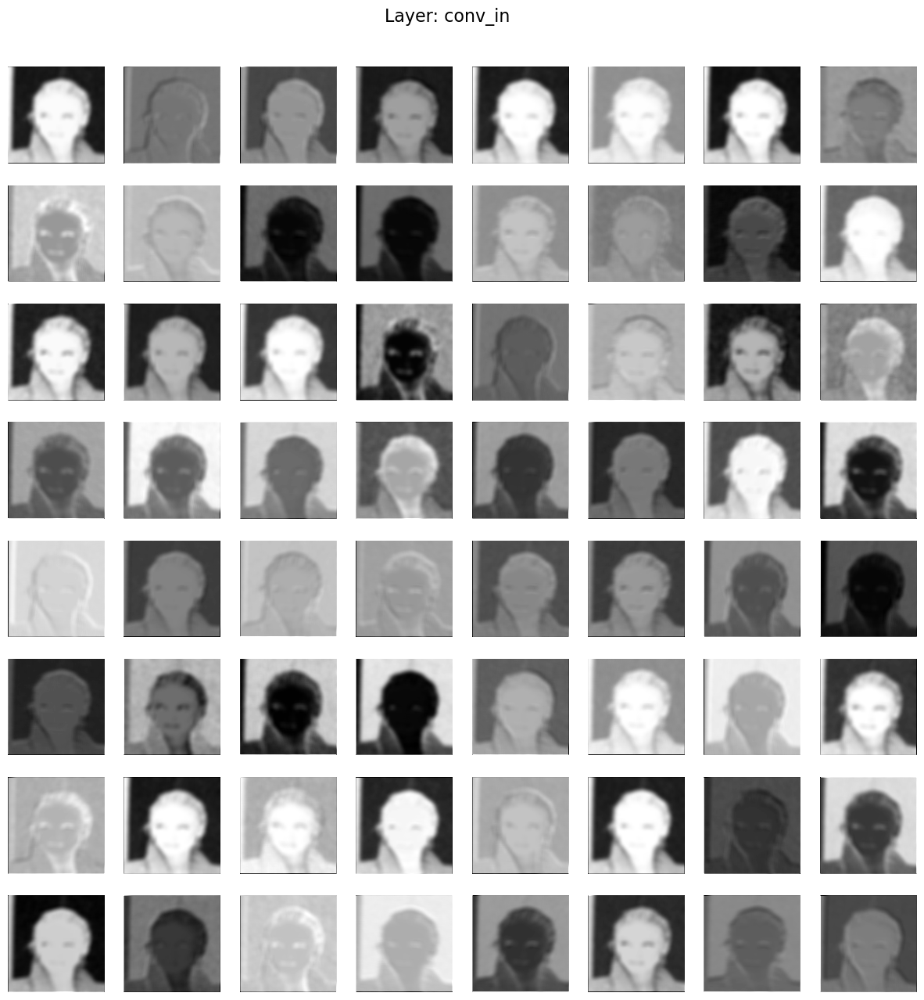

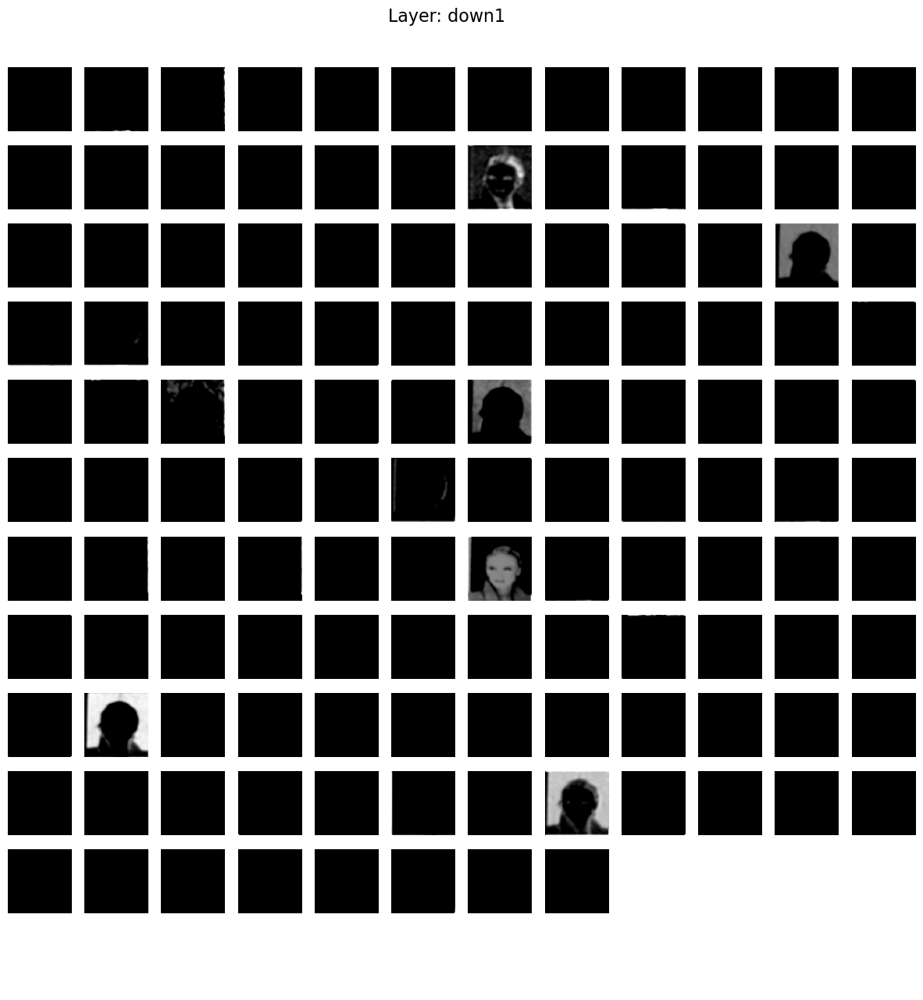

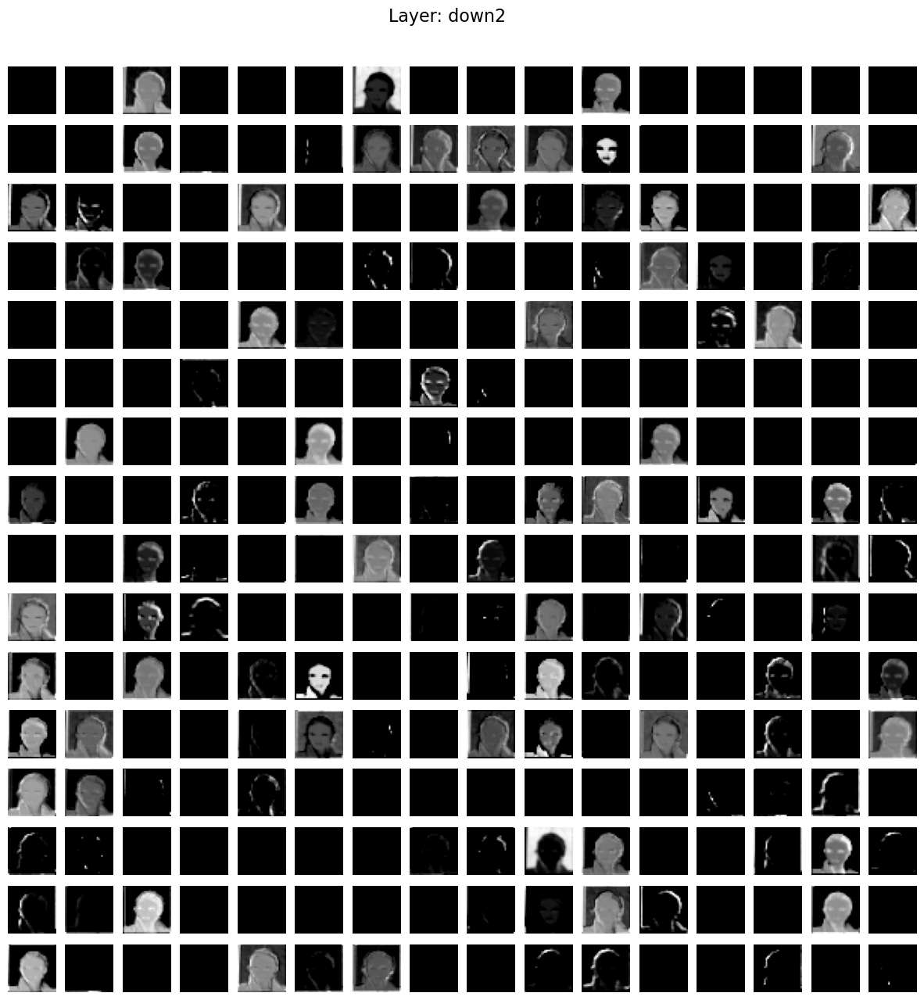

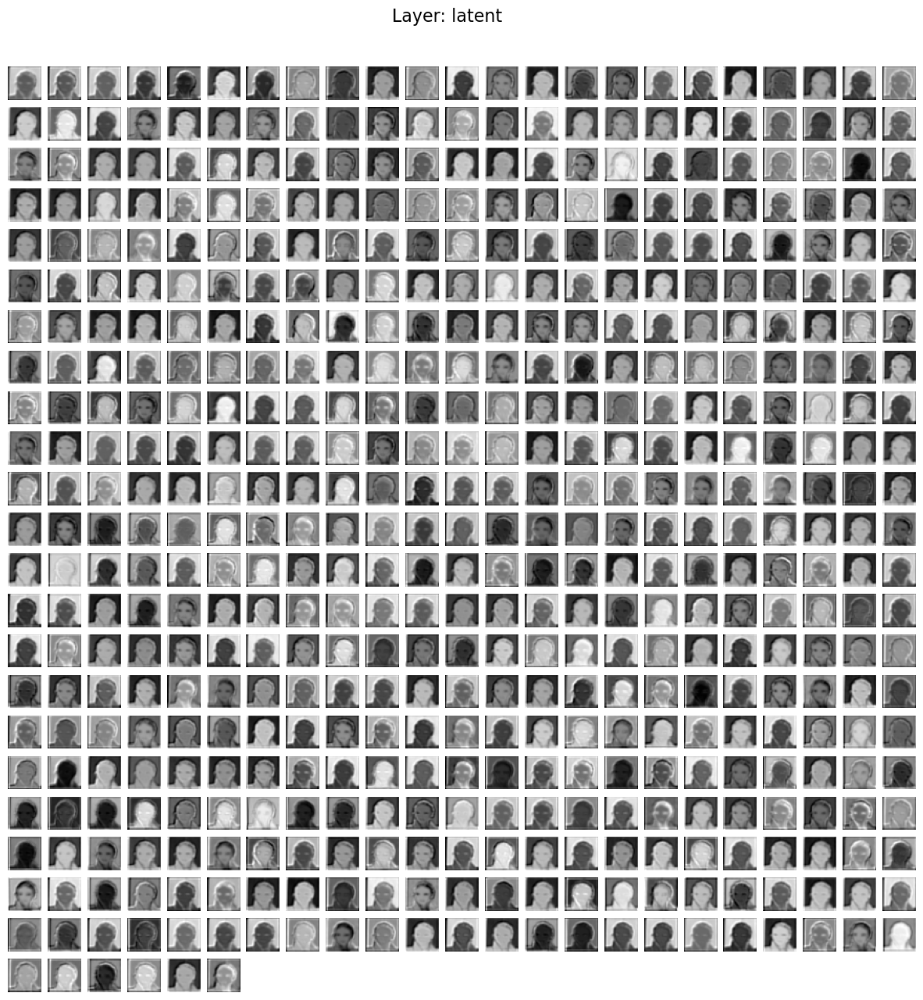

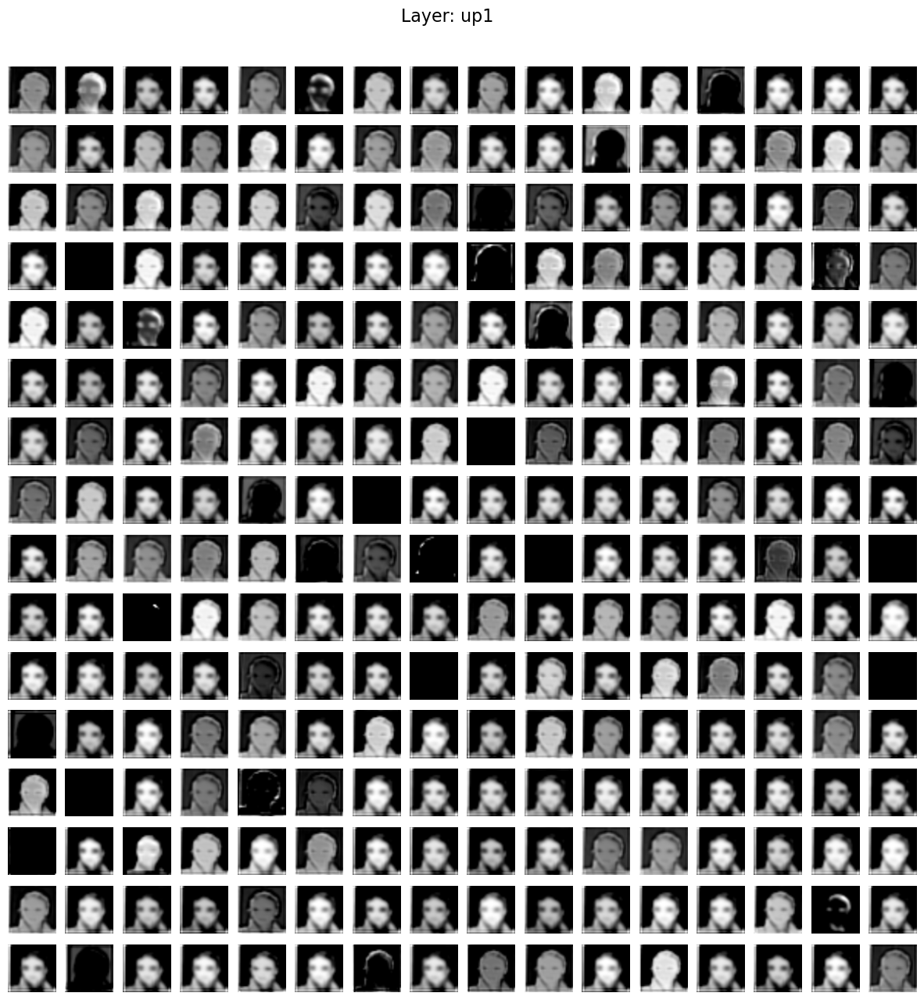

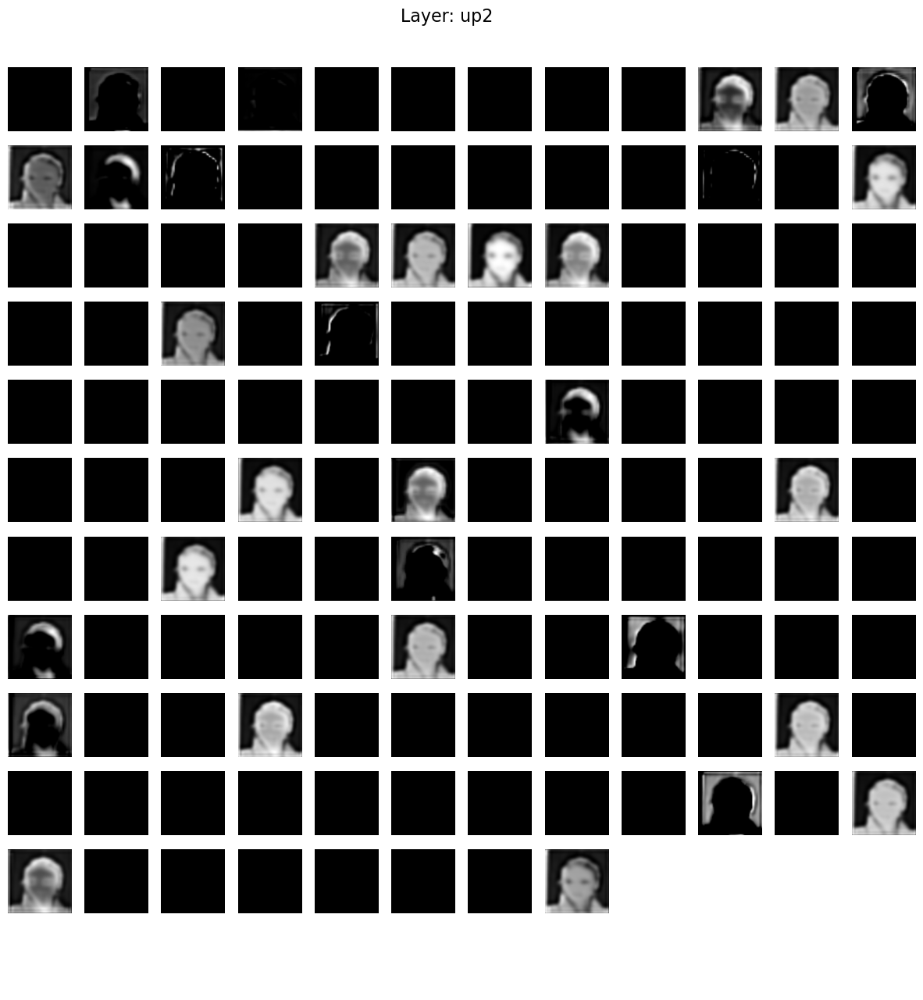

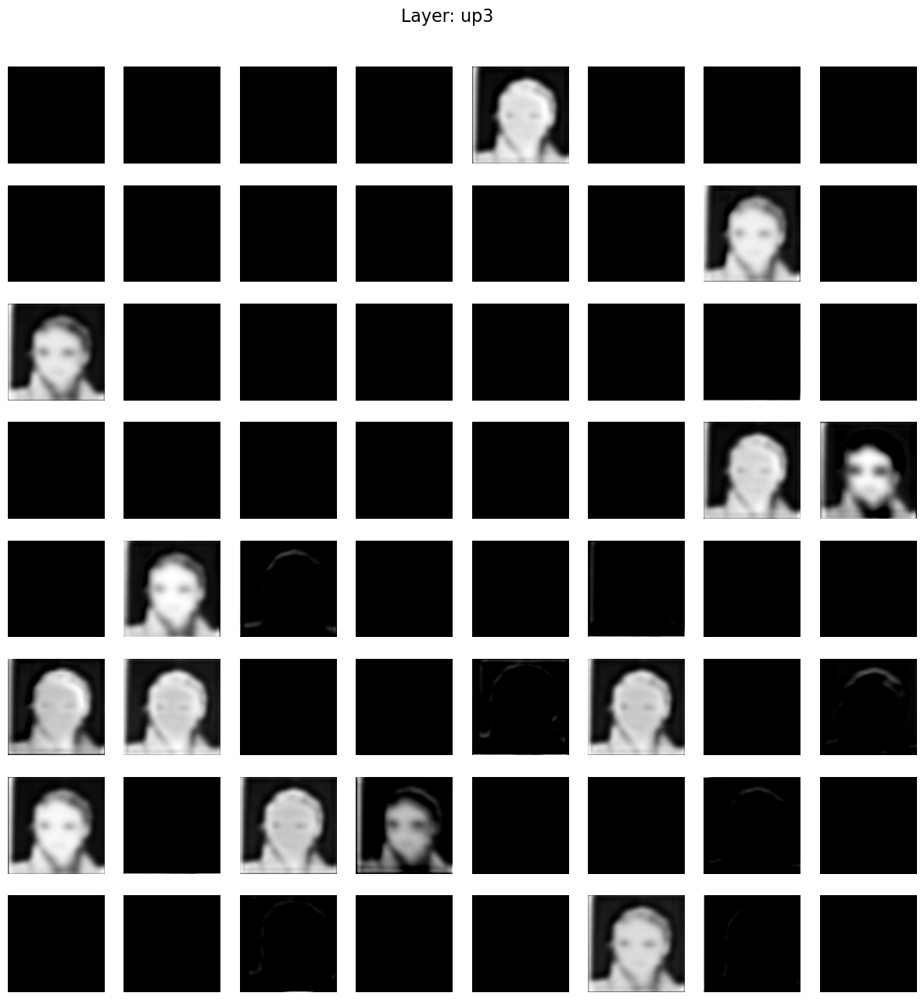

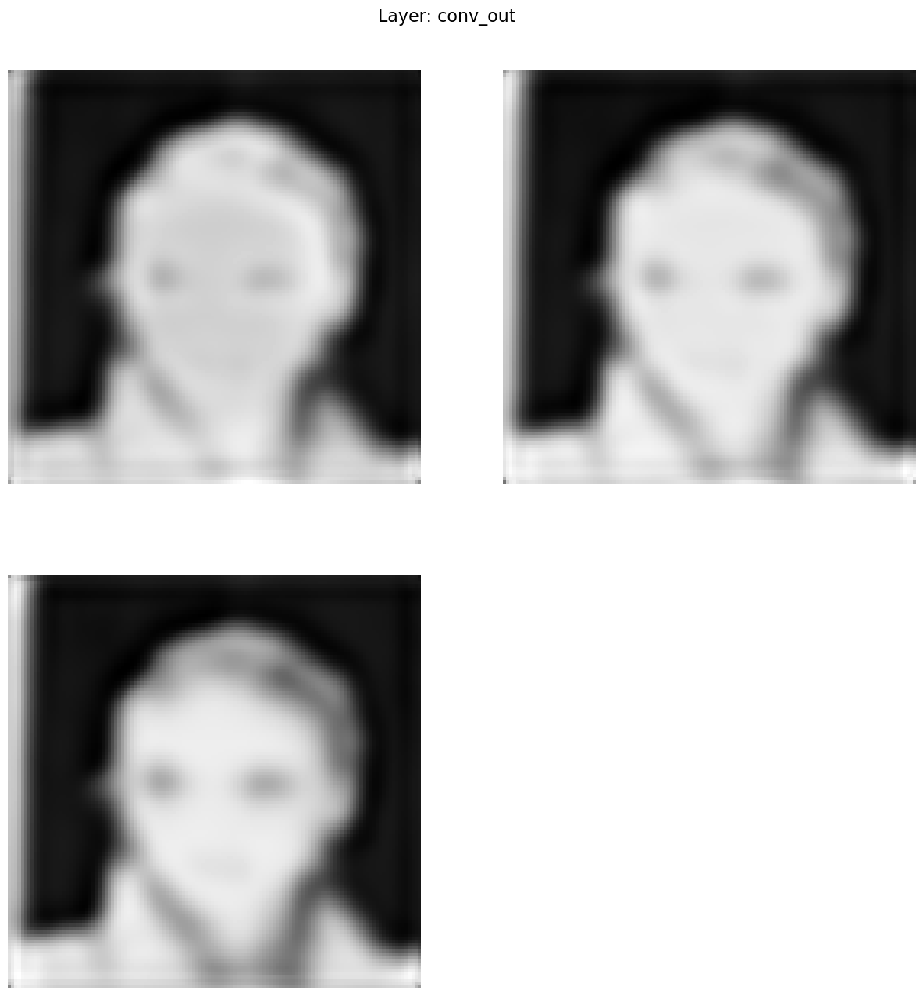

In [115]:
### START CODE HERE ###
target_layers = [
    'conv_in', 'down1', 'down2', 'latent', 
    'up1', 'up2', 'up3', 'conv_out'
]

# target_layers = [
#     'conv_in','down1'
# ]

# Use a single image from your DataLoader for visualization
data_iter = iter(trainloader)
x, _ = next(data_iter)  # Get a batch from the DataLoader
x = x[0].unsqueeze(0)  # Add batch dimension

visualize_feature_map(x, "feature_maps/feature_map", model, target_layers)
### END CODE HERE ###

---

# Questions:
1. Explain how changing the number of layers and the number of nodes in a Convolutional Neural Network (CNN) affects its performance (model accuracy, training time, and generalization/overfitting?  
2. Explain a comparison of PSNR and SSIM values (objective measurment) to your eye perception (subjective measurement) and suggest the criteria for High, Medium, Low image quality.
3. Explain a comparison of the autoencoder results between training without/with augmentation by visualizing feature maps at each layer.
4. Ranking the autoencoder performance in terms of PSNR and SSIM for each augmentation technique. Which augmentation techiques are mostly affect the autoencoder performance and must introduce to the training?
5. If a flatten layer is added after the last downsampling block to create the latent code (1D) and a dense layer ((linear + activation node)+ reshape back to the feature map size of input of the first upsampling block ) is added at the first layer of decoder before the first upsampling block. Explain a comparison of autoencoder results between 2D vs 1D latent and how feature map of each decoder block changes?
6. Explain the effect of reduced latent code from 2D to 1D.

# Answers:
1.  **การเปลี่ยนแปลงจำนวน Layer และ Node:**
    - การเพิ่มจำนวน layer และ Node : ช่วยให้ CNN เรียนรู้รูปแบบที่ซับซ้อนมากขึ้นในข้อมูล ทำให้เพิ่มความแม่นยำของโมเดล แต่หากเพิ่มเลเยอร์มากเกินไปอาจเกิด Overfitting ซึ่งหมายถึงโมเดลเรียนรู้ข้อมูลฝึกมากเกินไปและไม่สามารถทั่วไปกับข้อมูลใหม่ได้ ทำให้เวลาฝึกเพิ่มขึ้นด้วย
    - การลดจำนวน layer และ Node  : การลดจำนวนชั้นอาจจำกัดความสามารถของโมเดลในการจับคุณลักษณะที่ซับซ้อนลง ซึ่งอาจลดความแม่นยำในงานนั้นๆ
---
2. ค่า PSNR (Peak Signal-to-Noise Ratio) และ SSIM (Structural Similarity Index) เป็นตัววัดเชิงวัตถุ (objective measurement) ที่ใช้ประเมินคุณภาพของภาพ โดยวัดความแตกต่างระหว่างภาพต้นฉบับกับภาพที่ถูกบีบอัดหรือประมวลผล
    - **PSNR:** วัดความแตกต่างระหว่างพิกเซลของภาพต้นฉบับกับภาพที่ถูกบีบอัดหรือประมวลผล 
        - ค่า PSNR สูงขึ้นแสดงถึงคุณภาพของภาพที่ดีขึ้น
    - **SSIM:** วัดความคล้ายคลึงกันระหว่างโครงสร้างของภาพต้นฉบับกับภาพที่ถูกบีบอัดหรือประมวลผล 
        - ค่า SSIM สูงขึ้นแสดงถึงคุณภาพของภาพที่ดีขึ้น
        
    การรับรู้ด้วยตาคน (subjective measurement) เป็นการประเมินคุณภาพของภาพโดยมนุษย์ โดยพิจารณาจากความคมชัด สี ความเป็นธรรมชาติ และความผิดเพี้ยนของภาพ

    **การเปรียบเทียบและเกณฑ์การประเมินคุณภาพภาพ:**

    - **PSNR และ SSIM สูง:**
        - **การรับรู้ด้วยตาคน:** โดยทั่วไปภาพจะมีคุณภาพสูง คมชัด สีถูกต้อง และไม่มีความผิดเพี้ยนที่เห็นได้ชัด
        - **เกณฑ์:** PSNR > 40 dB และ SSIM > 0.95

    - **PSNR และ SSIM ปานกลาง:**
        - **การรับรู้ด้วยตาคน:** ภาพอาจมีความผิดเพี้ยนเล็กน้อย เช่น ความเบลอหรือสีเพี้ยน แต่ยังสามารถรับรู้ได้อย่างชัดเจน
        - **เกณฑ์:** 30 dB < PSNR ≤ 40 dB และ 0.85 < SSIM ≤ 0.95

    - **PSNR และ SSIM ต่ำ:**
        - **การรับรู้ด้วยตาคน:** ภาพจะมีความผิดเพี้ยนอย่างเห็นได้ชัด เช่น ความเบลอมาก สีผิดเพี้ยน หรือมีอาร์ติแฟกต์ (artifact)
        - **เกณฑ์:** PSNR ≤ 30 dB และ SSIM ≤ 0.85    
---
3.  **Autoencoder ที่สร้างขึ้นในโค้ดนี้ประกอบด้วย:**
    - **Encoder:** ประกอบด้วยการคอนโวลูชัน (convolution) และการลดขนาด (downsampling) โดยมี 3 ชั้นหลักที่เรียนรู้ลักษณะจากข้อมูลต้นฉบับและลดขนาดข้อมูลลง
    - **Latent Space:** เป็นการแปลงลักษณะที่ลดขนาดลงไปยังมิติที่สูงขึ้น
    - **Decoder:** ประกอบด้วยการขยายขนาด (upsampling) และการคอนโวลูชัน (convolution) เพื่อสร้างภาพที่ฟื้นฟูจากข้อมูลใน latent space กลับไปเป็นขนาดเดิม


    **การฝึกโดยไม่ใช้การเพิ่มข้อมูล (without augmentation):**
    - **Feature Maps:** การฝึกโดยไม่ใช้การเพิ่มข้อมูลมักทำให้โมเดลเรียนรู้ลักษณะที่เฉพาะเจาะจงสำหรับชุดข้อมูลการฝึก โดยที่ feature maps ในแต่ละชั้นอาจแสดงลักษณะที่ชัดเจนจากข้อมูลที่เห็นบ่อย เช่น เส้นขอบ, รูปทรง หรือสีที่มีลักษณะเฉพาะที่ปรากฏบ่อยในชุดข้อมูลการฝึก
    - **Encoder:** อาจแสดงการเรียนรู้ลักษณะเฉพาะที่มีในข้อมูลการฝึก เช่น พื้นผิวหรือสีที่ชัดเจน
    - **Latent Space:** ลักษณะของ latent space อาจสะท้อนถึงข้อมูลที่ถูกเรียนรู้จากชุดข้อมูลการฝึก และอาจไม่สามารถจับลักษณะทั่วไปที่หลากหลายได้ดี
    - **Decoder:** อาจแสดงการฟื้นฟูที่มีความผิดปกติหรือความไม่แน่นอนในพื้นที่ที่ไม่คุ้นเคยจากข้อมูลการฝึก

    **การฝึกโดยใช้การเพิ่มข้อมูล (with augmentation):**
    - **Feature Maps:** การฝึกโดยใช้การเพิ่มข้อมูลช่วยให้โมเดลเรียนรู้จากความหลากหลายของข้อมูลที่เพิ่มเข้ามา การเรียนรู้ลักษณะทั่วไปและไม่เฉพาะเจาะจง โดย feature maps ในแต่ละชั้นจะสามารถจับลักษณะที่หลากหลายได้ดีขึ้น
    - **Encoder:** อาจแสดงลักษณะที่หลากหลายขึ้น เช่น พื้นผิวและรูปทรงที่หลากหลายมากขึ้น
    - **Latent Space:** ลักษณะของ latent space มักจะสะท้อนถึงการเรียนรู้ลักษณะที่หลากหลายและมีความสามารถในการจัดการกับข้อมูลที่หลากหลายได้ดี
    - **Decoder:** อาจแสดงการฟื้นฟูที่ดีขึ้นและมีความใกล้เคียงกับภาพต้นฉบับมากขึ้น เนื่องจากโมเดลได้เรียนรู้จากความหลากหลายของข้อมูล


    **การวิเคราะห์ผลลัพธ์:**

     **Feature Maps:**
    - **การฝึกโดยไม่ใช้การเพิ่มข้อมูล:** Feature maps อาจแสดงการเรียนรู้ที่เฉพาะเจาะจงและมักมีลักษณะเหมือนกันกับข้อมูลการฝึก ผลลัพธ์ที่ได้อาจมีการ decoding ที่ผิดพลาดขึ้นเมื่อเจอกับข้อมูลที่แตกต่างจากชุดการฝึก
    - **การฝึกโดยใช้การเพิ่มข้อมูล:** Feature maps มักจะสามารถจับลักษณะที่หลากหลายและทั่วไปได้ดีขึ้น การ decoding จะมีความแม่นยำมากขึ้น และสามารถจัดการกับข้อมูลที่ไม่คุ้นเคยได้ดี

    - **Latent Space:**
    - **การฝึกโดยไม่ใช้การเพิ่มข้อมูล:** Latent space อาจแสดงข้อมูลที่มีลักษณะเฉพาะจากชุดการฝึก ทำให้การฟื้นฟูจาก latent space อาจไม่สมบูรณ์เมื่อเจอข้อมูลที่แตกต่าง
    - **การฝึกโดยใช้การเพิ่มข้อมูล:** Latent space มักจะมีลักษณะที่หลากหลายและสามารถจับลักษณะทั่วไปจากข้อมูลที่หลากหลายได้ดี ทำให้การ decoding มีคุณภาพดีขึ้น

    - **Decoder Output:**
    - **การฝึกโดยไม่ใช้การเพิ่มข้อมูล:** การ decoding อาจมีความผิดปกติหรือมีความแตกต่างจากภาพต้นฉบับเมื่อเจอข้อมูลใหม่
    - **การฝึกโดยใช้การเพิ่มข้อมูล:** การ decoding มักจะใกล้เคียงกับภาพต้นฉบับมากขึ้นเนื่องจากโมเดลได้เรียนรู้จากความหลากหลายของข้อมูล
---
4.  **Augmentation Techniques:**

    เทคนิคการเพิ่มข้อมูลที่พบบ่อย ได้แก่:
    - **การหมุน (Rotation):** การหมุนภาพในมุมต่างๆ
    - **การแปล (Translation):** การเคลื่อนย้ายภาพในทิศทางต่างๆ
    - **การปรับขนาด (Scaling):** การเปลี่ยนขนาดของภาพ
    - **การพลิก (Flipping):** การพลิกภาพในแนวนอนหรือแนวตั้ง
    - **การเพิ่มความสว่าง/คอนทราสต์ (Brightness/Contrast Adjustment):** การปรับความสว่างและคอนทราสต์ของภาพ
    - **การเพิ่มเสียงรบกวน (Noise Addition):** การเพิ่มเสียงรบกวนให้กับภาพ

    **การจัดอันดับประสิทธิภาพของ Autoencoder:**

    - **การหมุน (Rotation):**
        - **PSNR:** มักจะไม่ลดลงมากนัก เพราะการหมุนไม่เปลี่ยนแปลงลักษณะของภาพอย่างมาก
        - **SSIM:** ค่า SSIM อาจไม่ลดลงมาก เนื่องจากการหมุนรักษาโครงสร้างของภาพไว้ได้

    - **การแปล (Translation):**
        - **PSNR:** อาจลดลงเล็กน้อยหากการแปลทำให้ภาพถูกตัดหรือมีข้อมูลหายไป
        - **SSIM:** ค่า SSIM อาจลดลงเล็กน้อยเนื่องจากการแปลอาจทำให้การจัดเรียงของพิกเซลเปลี่ยนแปลง

    - **การปรับขนาด (Scaling):**
        - **PSNR:** อาจลดลงหากการปรับขนาดทำให้ภาพมีการบิดเบือนหรือสูญเสียรายละเอียด
        - **SSIM:** ค่า SSIM อาจลดลงมาก เนื่องจากการปรับขนาดอาจทำให้เกิดการบิดเบือนของโครงสร้าง

    - **การพลิก (Flipping):**
        - **PSNR:** มักจะไม่ลดลงมากนัก เพราะการพลิกเป็นการเปลี่ยนแปลงที่ไม่ทำให้เกิดการสูญเสียข้อมูล
        - **SSIM:** ค่า SSIM มักจะไม่ลดลงมากนัก เนื่องจากการพลิกยังคงรักษาโครงสร้างหลักของภาพ

    - **การเพิ่มความสว่าง/คอนทราสต์ (Brightness/Contrast Adjustment):**
        - **PSNR:** อาจลดลงเล็กน้อยเนื่องจากการเปลี่ยนแปลงความสว่างและคอนทราสต์
        - **SSIM:** ค่า SSIM อาจลดลงเนื่องจากการเปลี่ยนแปลงความสว่างและคอนทราสต์สามารถทำให้โครงสร้างของภาพมีการเปลี่ยนแปลง

    - **การเพิ่มเสียงรบกวน (Noise Addition):**
        - **PSNR:** มักจะลดลงมากเนื่องจากการเพิ่มเสียงรบกวนทำให้เกิดการผิดปกติในภาพ
        - **SSIM:** ค่า SSIM มักลดลงมาก เนื่องจากเสียงรบกวนทำให้เกิดการบิดเบือนของโครงสร้าง

    **เทคนิคการเพิ่มข้อมูลที่มีผลมากที่สุด:**

    เทคนิคการเพิ่มข้อมูลที่มีผลกระทบมากที่สุดต่อประสิทธิภาพของ Autoencoder คือ:
    - **การเพิ่มเสียงรบกวน (Noise Addition):** มีผลกระทบมากที่สุดต่อค่า PSNR และ SSIM เพราะเสียงรบกวนเพิ่มความผิดปกติในภาพ ทำให้ความคล้ายคลึงกับภาพต้นฉบับลดลง
    - **การปรับขนาด (Scaling):** มีผลกระทบปานกลางต่อค่า PSNR และ SSIM เพราะการปรับขนาดอาจทำให้ภาพสูญเสียรายละเอียดหรือเกิดการบิดเบือน

    ในทางปฏิบัติ การใช้เทคนิคการเพิ่มข้อมูลที่เหมาะสมสามารถช่วยปรับปรุงความสามารถในการทั่วไปของ Autoencoder ได้ดี ควรเลือกเทคนิคที่ช่วยเพิ่มความหลากหลายของข้อมูลโดยไม่ทำให้เกิดการบิดเบือนที่มากเกินไป เพื่อให้การฝึกโมเดลมีประสิทธิภาพสูงสุด

---
5.  **Autoencoder แบบ 2D Latent Code**

    ลักษณะของโมเดล:
    - **Encoder:** ใช้ DownSampling Block เพื่อลดขนาดของข้อมูลในแต่ละชั้นให้เป็นลักษณะที่มีมิติ 2D
    - **Latent Space:** รหัสลักษณะเป็นภาพที่มีมิติ 2D
    - **Decoder:** ใช้ UpSampling Block เพื่อลดขนาดของรหัสลักษณะกลับไปเป็นขนาดของภาพต้นฉบับ

    ผลลัพธ์:
    - **Feature Maps:** ในการใช้ Latent Code แบบ 2D, แผนที่ลักษณะที่ได้จากแต่ละชั้นใน Decoder จะมีโครงสร้างที่ตรงตามลักษณะของภาพต้นฉบับ โดยที่ข้อมูล 2D ของ Latent Code ช่วยให้ Decoder สามารถเรียนรู้การขยายขนาดและสร้างภาพที่ฟื้นฟูได้ดีขึ้น
    - **การเรียนรู้:** การใช้ Latent Code แบบ 2D ช่วยให้การเรียนรู้ลักษณะทั่วไปมีประสิทธิภาพดีกว่า เพราะข้อมูลที่เรียนรู้ใน Latent Space มีโครงสร้างที่เป็นธรรมชาติและสามารถนำมาใช้ในการฟื้นฟูได้ง่าย

    **Autoencoder แบบ 1D Latent Code**

    ลักษณะของโมเดล:
    - **Encoder:** ใช้ DownSampling Block เพื่อลดขนาดของข้อมูลในแต่ละชั้นให้เป็นลักษณะที่มีมิติ 2D จากนั้นใช้ชั้น Flatten เพื่อแปลงข้อมูลเป็นเวกเตอร์ 1D
    - **Latent Space:** รหัสลักษณะเป็นเวกเตอร์ 1D
    - **Decoder:** ก่อนการเริ่มการขยายขนาด ใช้ Dense Layer (ชั้น Linear + Activation) เพื่อแปลงเวกเตอร์ 1D กลับไปเป็นแผนที่ลักษณะ 2D ที่สามารถใช้ใน UpSampling Block

    ผลลัพธ์:
    - **Feature Maps:** การใช้ Latent Code แบบ 1D ทำให้การเรียนรู้ต้องผ่านการแปลงจากเวกเตอร์ 1D กลับเป็นแผนที่ลักษณะ 2D ก่อนการขยายขนาด ซึ่งอาจทำให้ข้อมูลสูญเสียลักษณะของภาพต้นฉบับบางอย่าง การแปลงนี้สามารถทำให้เกิดการบิดเบือนหรือข้อผิดพลาดในการฟื้นฟูภาพ
    - **การเรียนรู้:** การใช้ Latent Code แบบ 1D อาจทำให้มีการสูญเสียข้อมูลเมื่อแปลงจาก 2D เป็น 1D และกลับมาเป็น 2D อีกครั้ง ซึ่งอาจทำให้การฟื้นฟูภาพมีความผิดปกติหรือมีคุณภาพต่ำลง

    **การเปรียบเทียบผลลัพธ์**

    - คุณภาพของการฟื้นฟู (Reconstruction Quality):
        - **2D Latent Code:** โดยทั่วไปจะให้ผลลัพธ์ที่ดีกว่าในการฟื้นฟูภาพ เพราะข้อมูลยังคงรักษาลักษณะ 2D ซึ่งทำให้การขยายขนาดใน Decoder มีความแม่นยำและสมจริงมากขึ้น
        - **1D Latent Code:** อาจให้ผลลัพธ์ที่ด้อยลง เนื่องจากการแปลงข้อมูลจาก 2D เป็น 1D และกลับไปเป็น 2D ทำให้มีความเป็นไปได้ที่จะสูญเสียรายละเอียดและเกิดข้อผิดพลาดในการฟื้นฟู

    - การเปลี่ยนแปลงของ Feature Maps:
        - **2D Latent Code:** Feature maps ที่สร้างขึ้นใน Decoder จะมีความต่อเนื่องและรักษาลักษณะของข้อมูลได้ดี เนื่องจากการเริ่มต้นจากข้อมูล 2D
        - **1D Latent Code:** Feature maps อาจแสดงความผิดปกติหรือความแตกต่างจากภาพต้นฉบับมากขึ้น เนื่องจากการแปลงข้อมูลที่อาจทำให้เกิดการบิดเบือน

    - การเรียนรู้ลักษณะ (Feature Learning):
        - **2D Latent Code:** ช่วยให้การเรียนรู้ลักษณะมีประสิทธิภาพสูงขึ้นเพราะการเรียนรู้สามารถจับลักษณะของข้อมูล 2D ได้ดี
        - **1D Latent Code:** อาจทำให้การเรียนรู้ลักษณะมีประสิทธิภาพต่ำลง เนื่องจากการแปลงที่อาจทำให้ข้อมูลสูญเสียความสัมพันธ์บางประการ

    **สรุป**
    
    การใช้ Latent Code แบบ 2D มักจะมีประสิทธิภาพที่ดีกว่าในการฟื้นฟูภาพ เนื่องจากข้อมูลรักษาความสัมพันธ์ 2D ที่สำคัญสำหรับการขยายขนาดและการสร้างภาพ ในขณะที่ Latent Code แบบ 1D อาจทำให้เกิดความสูญเสียของรายละเอียดและการบิดเบือนของข้อมูล การเปลี่ยนแปลงของ Feature Maps ใน Decoder จะมีความแม่นยำมากขึ้นและสอดคล้องกับภาพต้นฉบับมากขึ้นในกรณีที่ใช้ Latent Code แบบ 2D
---
6.  **Latent Code แบบ 2D และ 1D**
    - **Latent Code แบบ 2D:** ในการใช้ Latent Code แบบ 2D ข้อมูลใน Latent Space จะมีรูปแบบเป็นแผนที่ลักษณะ (feature map) ที่มีมิติ 2D ซึ่งสามารถรักษาข้อมูลเชิงพื้นที่ (spatial information) ได้ดี เช่น พื้นที่และรูปทรงของลักษณะ
    - **Latent Code แบบ 1D:** เมื่อเปลี่ยนไปใช้ Latent Code แบบ 1D ข้อมูลจะถูกแปลงเป็นเวกเตอร์ 1 มิติ ซึ่งจะสูญเสียความสัมพันธ์เชิงพื้นที่ของข้อมูล 2D

    **ผลกระทบของการลดขนาด Latent Code**

    **1. การสูญเสียข้อมูล**

    - **Latent Code แบบ 2D:** สามารถรักษาลักษณะและความสัมพันธ์เชิงพื้นที่ได้ดี การเรียนรู้ลักษณะของข้อมูลใน Latent Space จะมีความแม่นยำและสอดคล้องกับลักษณะของข้อมูลต้นฉบับ
    - **Latent Code แบบ 1D:** การแปลงข้อมูล 2D เป็น 1D ทำให้เกิดการสูญเสียข้อมูลเชิงพื้นที่ ซึ่งหมายความว่าโครงสร้างและรายละเอียดของข้อมูลอาจหายไปในกระบวนการแปลง

    **2. การเรียนรู้ลักษณะ (Feature Learning)**

    - **Latent Code แบบ 2D:** เนื่องจากการรักษาความสัมพันธ์เชิงพื้นที่ การเรียนรู้ลักษณะจะมีความแม่นยำมากขึ้น และโมเดลจะสามารถจับลักษณะของข้อมูลที่มีความละเอียดและเชื่อมโยงได้ดี
    - **Latent Code แบบ 1D:** โมเดลจะต้องเรียนรู้จากข้อมูลที่แปลงเป็นเวกเตอร์ 1 มิติ ซึ่งอาจทำให้ยากขึ้นในการจับลักษณะเชิงพื้นที่ ทำให้การเรียนรู้ลักษณะมีความแม่นยำน้อยลง

    **3. ประสิทธิภาพในการฟื้นฟู (Reconstruction Performance)**

    - **Latent Code แบบ 2D:** การคืนภาพจาก Latent Code แบบ 2D มักจะมีความแม่นยำสูง เนื่องจากข้อมูลเชิงพื้นที่ยังคงอยู่ ทำให้การขยายขนาดใน Decoder สามารถสร้างภาพที่ฟื้นฟูได้ดี
    - **Latent Code แบบ 1D:** การคืนภาพจาก Latent Code แบบ 1D อาจมีข้อผิดพลาดหรือความบิดเบือนมากขึ้น เนื่องจากการแปลงจากเวกเตอร์ 1 มิติกลับไปเป็นแผนที่ลักษณะ 2D อาจทำให้สูญเสียรายละเอียดและข้อมูลที่สำคัญ

    **4. ความยืดหยุ่นและความสามารถในการทั่วไป (Generalization)**

    - **Latent Code แบบ 2D:** เนื่องจากข้อมูลใน Latent Space เป็นแบบ 2D โมเดลสามารถจัดการกับความหลากหลายของข้อมูลได้ดีขึ้น และมีความสามารถในการทั่วไปที่ดีกว่า
    - **Latent Code แบบ 1D:** การเรียนรู้จากเวกเตอร์ 1 มิติอาจทำให้โมเดลมีความยืดหยุ่นน้อยลงและมีความสามารถในการทั่วไปที่ต่ำกว่า เนื่องจากข้อมูลที่ลดขนาดไปอาจไม่สามารถสะท้อนลักษณะของข้อมูลต้นฉบับได้ครบถ้วน
---